In [1]:
import numpy as np
import h5py
from IPython.display import Image

import matplotlib
from matplotlib import pyplot as plt
from matplotlib import pylab
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.dpi'] = 80
params = {'legend.fontsize': 'large',
          'figure.figsize': (8, 8),
         'axes.labelsize': 'x-large',
         'axes.titlesize': 'x-large',
         'xtick.labelsize': 'large',
         'ytick.labelsize': 'large'}
%matplotlib inline
pylab.rcParams.update(params)

In [2]:
base_dir = '/scratch/ksf293/kavli/anomaly'
plot_dir = '/home/ksf293/kavli/anomalies-GAN-HSC/plots/plots_2021-01-10'

In [3]:
tag = 'gri'
base_dir = '/scratch/ksf293/kavli/anomaly'
imarr_fn = f'{base_dir}/data/images_h5/images_{tag}.h5'
imarr = h5py.File(imarr_fn, 'r')
results_fn = f'{base_dir}/results/results_{tag}.h5'
res = h5py.File(results_fn, 'r')

In [33]:
gen_scores = res['gen_scores_sigma'][:]
disc_scores = res['disc_scores_sigma'][:]
scores = res['anomaly_scores_sigma'][:]
idxs = res['idxs'][:]
print(len(idxs))

942781


In [10]:
tag = 'gri'
imdict_fn = f'{base_dir}/data/idxdicts_h5/idx2imloc_{tag}.npy'
resdict_fn = f'{base_dir}/data/idxdicts_h5/idx2resloc_{tag}.npy'
idx2imloc = np.load(imdict_fn, allow_pickle=True).item()
idx2resloc = np.load(resdict_fn, allow_pickle=True).item()

In [14]:
from astropy.visualization import make_lupton_rgb
def luptonize(x, rgb_q=15, rgb_stretch=0.5, rgb_min=0):
    if x.ndim==3:
        x = make_lupton_rgb(x[:,:,2], x[:,:,1], x[:,:,0],
                      Q=rgb_q, stretch=rgb_stretch, minimum=rgb_min)
    elif x.ndim==4:
        x = np.array([make_lupton_rgb(xi[:,:,2], xi[:,:,1], xi[:,:,0],
                      Q=rgb_q, stretch=rgb_stretch, minimum=rgb_min)
                      for xi in x])
    else:
        raise ValueError(f"Wrong number of dimensions! Gave {x.ndim}, need 3 or 4")
    return x

In [37]:
def plot_ims(ids, nrows, ncols, saveto=None, headers=None, tight=False):
    assert len(ids)<=nrows*ncols, "bad rows/cols for number of ids!"
    
    subsize = 2
    fig, axarr = plt.subplots(nrows,ncols,figsize=(ncols*subsize,nrows*subsize))
    if tight:
        plt.subplots_adjust(hspace=0.03, wspace=-0.15)
    else:
        plt.subplots_adjust(hspace=0.2, wspace=0.05)
    plt.rc('text', usetex=True)
    
    count = 0
    for i in range(nrows):
        for j in range(ncols):
            idx = ids[count]
            loc = idx2imloc[idx]
            im = imarr['images'][loc]
            obj_id = int(imarr['object_ids'][loc])
            if nrows==1 and ncols==1:
                ax = axarr
            elif nrows==1:
                ax = axarr[j]
            elif ncols==1:
                ax = axarr[i]
            else:
                ax = axarr[i][j]
                
            if not tight:
                title = f"ID: {obj_id}"
                ax.set_title(title, fontsize=8)
            
            ax.imshow(luptonize(im))
            ax.set_xticks([])
            ax.set_yticks([])
            
            if headers is not None and i==0:
                # units are pixel values;
                nside = 96
                ax.text(nside/2,-nside/4,headers[j], size=16, horizontalalignment='center')
                
            count += 1
            if count>=len(ids):
                break
                
        if count>=len(ids):
            break
                
    if saveto:
        plt.savefig(saveto, bbox_inches='tight')#, pad_inches=0)

In [29]:
nrows = 6
ncols = 10
nplot = nrows*ncols

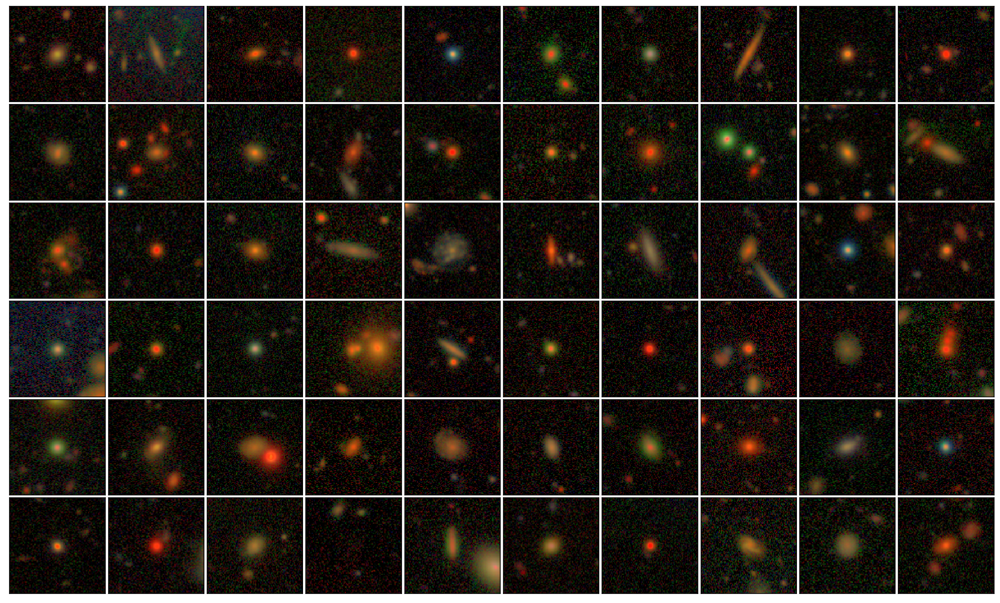

In [39]:
# random
idxs_sub = np.random.choice(idxs, nplot, replace=False)
plot_ims(idxs_sub, nrows, ncols, tight=True)

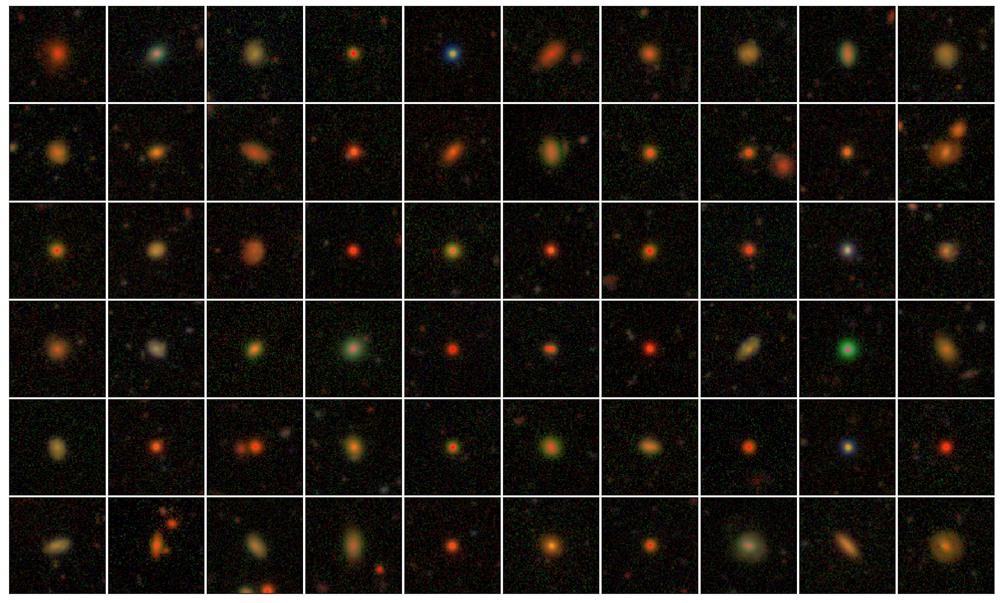

In [40]:
# boring 
locs = np.where(((gen_scores < -1) & (disc_scores < -1)))[0]
idxs_sub = [idxs[loc] for loc in locs]
idxs_sub = np.random.choice(idxs_sub, nplot, replace=False)
plot_ims(idxs_sub, nrows, ncols, tight=True)

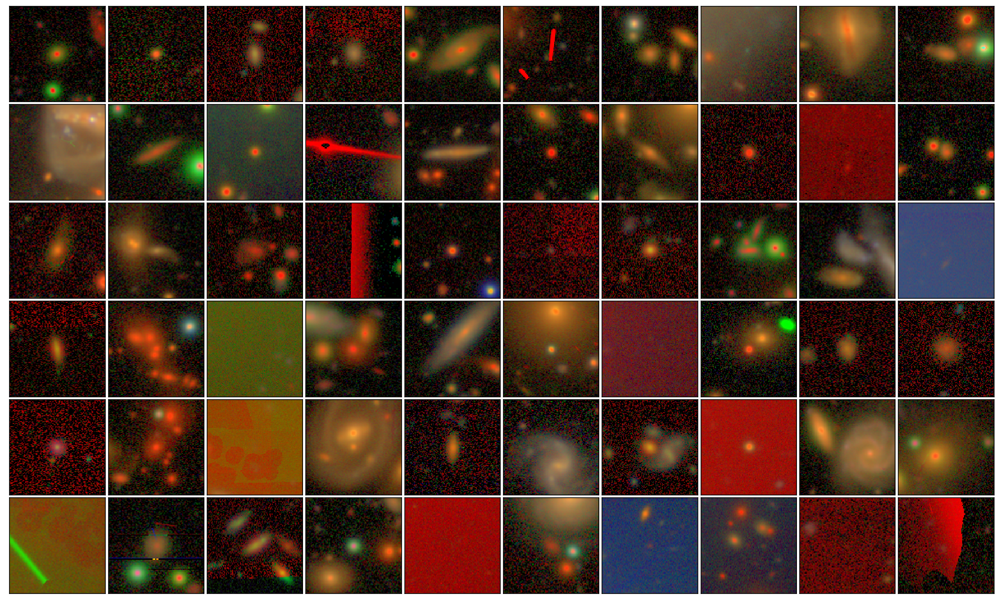

In [43]:
# higher disc 
locs = np.where(((gen_scores < 3) & (disc_scores > 3)))[0]
idxs_sub = [idxs[loc] for loc in locs]
idxs_sub = np.random.choice(idxs_sub, nplot, replace=False)
plot_ims(idxs_sub, nrows, ncols, tight=True)

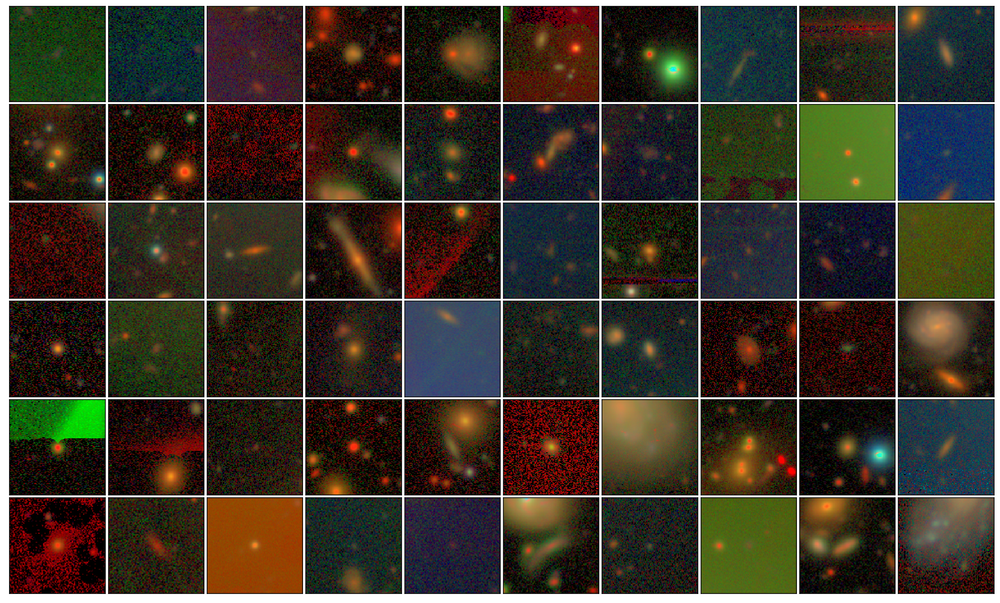

In [44]:
# high either 
locs = np.where(((gen_scores > 3) | (disc_scores > 3)))[0]
idxs_sub = [idxs[loc] for loc in locs]
idxs_sub = np.random.choice(idxs_sub, nplot, replace=False)
plot_ims(idxs_sub, nrows, ncols, tight=True)

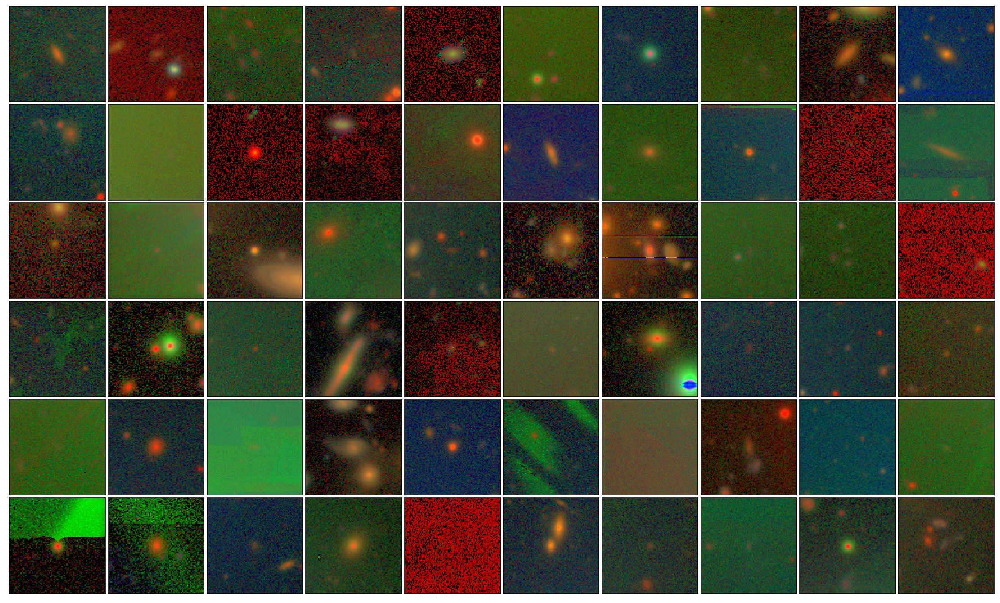

In [45]:
# high both 
locs = np.where(((gen_scores > 3) & (disc_scores > 3)))[0]
idxs_sub = [idxs[loc] for loc in locs]
idxs_sub = np.random.choice(idxs_sub, nplot, replace=False)
plot_ims(idxs_sub, nrows, ncols, tight=True)